# DeepMind Control Suite (Figures 12/13/14)

In [1]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
from dm_control import suite
from rliable import library as rly
from rliable import metrics, plot_utils
import utils

In [2]:
DMC_ENVS = [
    'acrobot-swingup',
    'cartpole-balance',
    'cartpole-balance-sparse',
    'cartpole-swingup',
    'cartpole-swingup-sparse',
    'cheetah-run',
    'cup-catch',
    'cup-spin',
    'dog-run',
    'dog-stand',
    'dog-trot',
    'dog-walk',
    'finger-spin',
    'finger-turn-easy',
    'finger-turn-hard',
    'fish-swim',
    'hopper-hop',
    'hopper-stand',
    'humanoid-run',
    'humanoid-stand',
    'humanoid-walk',
    'pendulum-spin',
    'pendulum-swingup',
    'quadruped-run',
    'quadruped-walk',
    'reacher-easy',
    'reacher-hard',
    'walker-run',
    'walker-stand',
    'walker-walk'
]

Load results of DC-MPC and baselines.

In [3]:
df = pd.concat([
    pd.read_csv("../data/dmc-dcmpc.csv"),
    pd.read_csv("../data/baselines/sac.csv"),
    pd.read_csv("../data/baselines/tdmpc2.csv"),
    pd.read_csv("../data/baselines/tdmpc.csv"),
    pd.read_csv("../data/baselines/dreamerv3.csv"),
])

In [4]:
def plot_dmc_grid(df, key: str = "episode_reward", save_path: str = None):
    plt.rcParams["font.size"] = 23
    plt.rcParams["legend.fontsize"] = 26
    
    # Only keep desired envs and reformat names
    df["env"] = df["env"].str.replace("_", "-")
    df = df[df["env"].isin(DMC_ENVS)]

    ncol = 5
    nrow = int(np.ceil(len(DMC_ENVS) / ncol))
    fig, axs = plt.subplots(
        nrow, ncol, figsize=(3.8 * ncol, 4 * nrow), sharey="row", sharex="col"
    )

    # Rename agents
    df = df[df["agent"].isin(utils.AGENTS.keys())]
    df.loc[:, "agent"] = df["agent"].replace(utils.AGENTS)

    for idx, env in enumerate(DMC_ENVS):
        data = df[df["env"] == env]
        row = idx // ncol
        col = idx % ncol
        ax = axs[row, col]

        hue_order = np.sort(data.agent.unique())

        legend = True if idx == len(DMC_ENVS) - 1 else False
        g = sns.lineplot(
            x="env_step",
            y=key,
            data=data,
            errorbar=("ci", 95),
            hue="agent",
            hue_order=hue_order,
            palette=utils.PALETTE,
            legend="auto" if legend else None,
            ax=ax,
        )
        g.set(xlim=(0, 2000), ylim=(0, 1020))

        ax.set_title(" ".join([ele.capitalize() for ele in env.split("-")]))
        ax.set_xlabel("Env. Steps")
        ax.set_xticks((0, 1e6, 2e6))
        ax.set_xticklabels(("0", "1M", "2M"))
        if col == 0:
            ax.set_ylabel(utils.YLABELS[key])

    l = axs[-1, -1].legend(
        loc="upper center",
        bbox_to_anchor=(-2.0, -0.3),
        fancybox=False,
        shadow=False,
        ncol=ncol,
    )
    for line in l.get_lines():
        line.set_linewidth(5.0)
    fig.subplots_adjust(
        bottom=0.1,
        hspace=0.3,
        wspace=0.2,
        left=0.06,
        right=0.97,
        top=0.98,
    )
    if save_path:
        plt.savefig(save_path)

plot_dmc_grid(df, save_path="./figs/dmcontrol_grid.pdf")

[1 2 3] for DCWM in acrobot-swingup, env_step=[1000000.]
[1 2 3] for DCWM in cartpole-balance, env_step=[1000000.]
[1 2 3] for DCWM in cartpole-balance-sparse, env_step=[1000000.]
[1 2 3] for DCWM in cartpole-swingup, env_step=[1000000.]
[1 2 3] for DCWM in cartpole-swingup-sparse, env_step=[1000000.]
[1 2 3] for DCWM in cheetah-run, env_step=[1000000.]
[1 2 3] for DCWM in cup-catch, env_step=[1000000.]
[1 2 3] for DCWM in cup-spin, env_step=[1000000.]
[1 2 3] for DCWM in finger-spin, env_step=[1000000.]
[1 2 3] for DCWM in finger-turn-easy, env_step=[1000000.]
[1 2 3] for DCWM in finger-turn-hard, env_step=[1000000.]
[1 2 3] for DCWM in fish-swim, env_step=[1000000.]
[1 2 3] for DCWM in hopper-hop, env_step=[1000000.]
[1 2 3] for DCWM in hopper-stand, env_step=[1000000.]
[1 2 3] for DCWM in pendulum-spin, env_step=[1000000.]
[1 2 3] for DCWM in pendulum-swingup, env_step=[1000000.]
[1 2 3] for DCWM in quadruped-run, env_step=[1000000.]
[1 2 3] for DCWM in quadruped-walk, env_step=[100

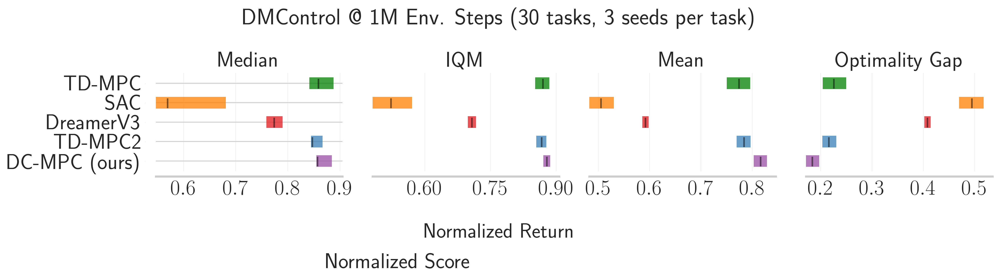

In [5]:
def plot_dmc_rliable(df, env_step: int = 1000000, verbose: bool = False):
    plt.rcParams["font.size"] = 12
    plt.rcParams["legend.fontsize"] = 12
    
    envs = df[df["agent"].isin(["DCWM"])]["env"].unique()
    envs = [env.replace("_", "-") for env in envs]
    df["env"] = df["env"].str.replace("_", "-")
    df = df[df["env"].isin(envs)]

    SEEDS = [0, 1, 2, 3, 4, 5]
    good_df = []
    for agent in utils.AGENTS.keys():
        for env in envs:
            num_seeds = 0
            for seed in SEEDS:
                df_ = df[
                    (df["agent"] == agent)
                    & (df["env"] == env)
                    & (df["seed"] == seed)
                    & (df["env_step"] >= env_step)
                ]
                df_closest = df_.iloc[(df_["env_step"] - env_step).abs().argsort()[:1]]
                # df_closest = df_.iloc[(df_["env_step"] - 500000).abs().argsort()[:1]]
                if seed == 0 and not df_.empty:
                    df_closest.loc[:, "seed"] = 3
                if num_seeds < 3:
                    good_df.append(df_closest)
                if not df_.empty:
                    num_seeds += 1

    df = pd.concat(good_df)

    def check_envs():
        for agent in df.agent.unique():
            for env in envs:
                agent_envs = df[df["agent"] == agent].env.unique()
                if env not in agent_envs:
                    print(f"{env} is NOT in {agent}")
                num_seeds = df[
                    (df["agent"] == agent) & (df["env"] == env)
                ].seed.unique()
                env_steps = df[
                    (df["agent"] == agent) & (df["env"] == env)
                ].env_step.unique()
                print(f"{num_seeds} for {agent} in {env}, env_step={env_steps}")

    if verbose:
        check_envs()

    # Only keep selected agents
    df = df[df["agent"].isin(utils.AGENTS.keys())]
    df["agent"] = df["agent"].replace(utils.AGENTS)

    def normalize(min, max):
        df["norm_score"] = (df["episode_reward"] - min) / (max - min)

    normalize(min=0, max=1000)

    scores_dict = {}
    # Loop over each unique agent to create a separate array for each
    for agent in df["agent"].unique():
        # Filter the DataFrame for the current agent
        agent_df = df[df["agent"] == agent]

        # Pivot the filtered DataFrame to create a multi-indexed table with "seed" as rows, "env" and "env_step" as columns
        pivoted_df = agent_df.pivot_table(
            values="norm_score", index="seed", columns=["env"]
        )

        # Convert the pivoted DataFrame to a numpy array
        array = pivoted_df.to_numpy(copy=True)

        # Reshape the array based on the unique counts of "seed", "env", and "env_step"
        array = array.reshape(
            len(agent_df["seed"].unique()), len(agent_df["env"].unique())
        )

        # Add the array to the dictionary with the agent as the key
        scores_dict[agent] = array

    # Load ALE scores as a dictionary mapping algorithms to their human normalized
    # score matrices, each of which is of size `(num_runs x num_games)`.
    # atari_200m_normalized_score_dict = ...
    aggregate_func = lambda x: np.array(
        [
            metrics.aggregate_median(x),
            metrics.aggregate_iqm(x),
            metrics.aggregate_mean(x),
            metrics.aggregate_optimality_gap(x),
        ]
    )
    aggregate_scores, aggregate_score_cis = rly.get_interval_estimates(
        scores_dict, aggregate_func, reps=50000
    )

    num_tasks = len(df.env.unique())
    fig, axes = plot_utils.plot_interval_estimates(
        aggregate_scores,
        aggregate_score_cis,
        metric_names=[
            "Median",
            "IQM",
            "Mean",
            "Optimality Gap",
        ],
        colors=utils.PALETTE,
        row_height=0.65,
        x_label="",
    )
    fig.supxlabel("Normalized Return", fontsize=20)

    steps = {500000: "500k", 1000000: "1M"}
    fig.suptitle(
        f"DMControl @ {steps[env_step]} Env. Steps ({num_tasks} tasks, {len(df.seed.unique())} seeds per task)",
        fontsize=22,
    )

    plt.tight_layout()
    plt.savefig(f"./figs/dmc_agg_rliable_{steps[env_step]}.pdf")

plot_dmc_rliable(df, verbose=True)

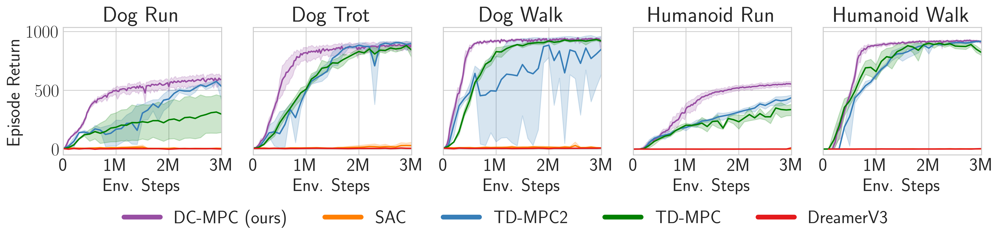

In [6]:
def plot_high_dim_control(df, key = "episode_reward"):
    plt.rcParams["font.size"] = 19
    plt.rcParams["legend.fontsize"] = 19

    main_envs = [
        "dog-walk",
        "dog-run",
        "dog-trot",
        "humanoid-run",
        "humanoid-walk",
    ]
    main_envs.sort()
    
    # Only keep dog/humanoid tasks
    df = df[df["env"].isin(main_envs)]

    # Rename agents
    df.loc[:, "agent"] = df["agent"].replace(utils.AGENTS)

    ncol = len(main_envs)
    nrow = 1
    fig, axs = plt.subplots(
        nrow,
        ncol,
        figsize=(3 * ncol, 3.5 * nrow),
        sharex="col",
        sharey="row",
    )

    for idx, env in enumerate(main_envs):
        data = df[df["env"] == env]
        col = idx % ncol
        ax = axs[col]

        legend = True if idx == len(main_envs) - 1 else False
        g = sns.lineplot(
            x="env_step",
            y=key,
            data=data,
            errorbar=("ci", 95),
            hue="agent",
            hue_order=df.agent.unique(),
            palette=utils.PALETTE,
            legend="auto" if legend else None,
            ax=ax,
        )

        ax.set_title(" ".join([ele.capitalize() for ele in env.split("-")]))
        ax.set_xlabel("Env. Steps")
        g.set(xlim=(0, 3e6))
        ax.set_xticks((0, 1e6, 2e6,3e6))
        ax.set_xticklabels(("0", "1M", "2M", "3M"))
        ax.set_ylabel("")
    
    axs[0].set_ylabel(utils.YLABELS[key])
    l = axs[-1].legend(
        loc="lower center",
        bbox_to_anchor=(-2.0, -0.7),
        fancybox=False,
        shadow=False,
        ncol=len(df.agent.unique()),
    )
    for line in l.get_lines():
        line.set_linewidth(5.0)

    plt.subplots_adjust(bottom=0.35, right=0.97, left=0.08)
    plt.savefig(f"./figs/high-dim-control.pdf")

plot_high_dim_control(df)

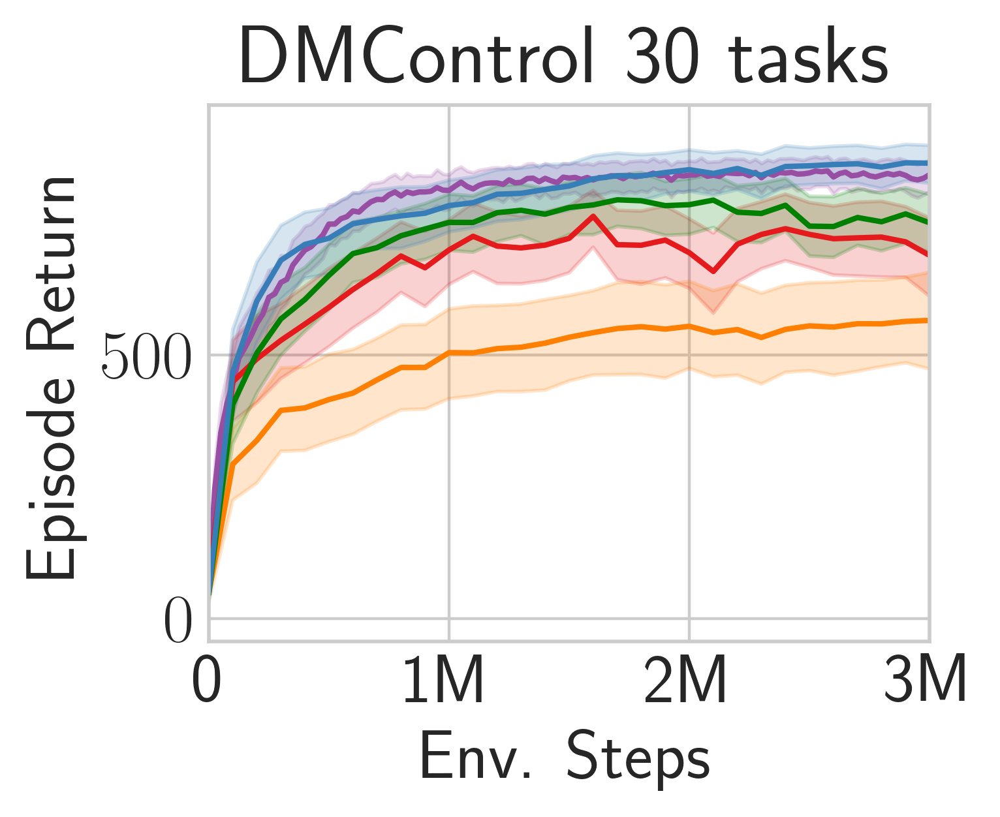

In [7]:
def plot_agg_training_curve(df, key="episode_reward"):
    plt.rcParams["font.size"] = 19
    plt.rcParams["legend.fontsize"] = 19

    df = df[df["env"].isin(DMC_ENVS)]

    df.loc[:, "agent"] = df["agent"].replace(utils.AGENTS)

    fig, ax = plt.subplots(1, 1, figsize=(4.2, 3.5))

    g = sns.lineplot(
        x="env_step",
        y=key,
        data=df,
        errorbar=("ci", 95),
        hue="agent",
        hue_order=np.sort(df.agent.unique()),
        palette=utils.PALETTE,
        legend=False,
        ax=ax,
    )

    num_tasks = len(df.env.unique())
    ax.set_title(f"DMControl {num_tasks} tasks")
    ax.set_xlabel("Env. Steps")
    g.set(xlim=(0, 3e6))
    ax.set_xticks((0, 1e6, 2e6, 3e6))
    ax.set_xticklabels(("0", "1M", "2M", "3M"))

    ax.set_ylabel(utils.YLABELS[key])

    plt.tight_layout()
    plt.savefig(f"./figs/dmc-agg-training-curve.pdf", bbox_inches="tight")

plot_agg_training_curve(df)